---
# Topological Cluster Statistics (TCS)

---

## Notebook 13: Brain Visualizations, localized sensitivity improvements

---

This notebook contains scripts that generate brain visualizations of the localized sensitivity improvements.



---

### Packages and basic functions


---

Loading required packages


In [1]:
import os
import numpy as np
import pandas as pd
import nibabel as nib
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from tqdm.notebook import tqdm

from cerebro import cerebro_brain_utils as cbu
from cerebro import cerebro_brain_viewer as cbv


---

Basic functions


In [2]:
def ensure_dir(file_name):
    os.makedirs(os.path.dirname(file_name), exist_ok=True)
    return file_name


def write_np(np_obj, file_path):
    with open(file_path, 'wb') as outfile:
        np.save(outfile, np_obj)


def load_np(file_path):
    with open(file_path, 'rb') as infile:
        return np.load(infile)


In [3]:
def plot_cifti_with_cerebro(axes, dscalar_file=None, dscalar_data=None, colormap=plt.cm.Spectral, **kwargs):
    my_brain_viewer = cbv.Cerebro_brain_viewer(offscreen=True, background_color=(1,1,1,0),)

    try:
        surface = 'inflated'
        surface_model = my_brain_viewer.load_template_GIFTI_cortical_surface_models(surface)

        cifti_expansion_scale=40
        cifti_left_right_seperation=20
        volumetric_structure_offset=(0, 10, -80)
        cifti_space = my_brain_viewer.visualize_cifti_space(
            volumetric_structures='all',
            cifti_expansion_scale=cifti_expansion_scale,
            cifti_left_right_seperation=cifti_left_right_seperation,
            volumetric_structure_offset=volumetric_structure_offset,
            volume_rendering='surface',
        )

        dscalar_layer = my_brain_viewer.add_cifti_dscalar_layer(
            dscalar_data=dscalar_data,
            dscalar_file=dscalar_file,
            colormap=colormap,
            opacity=0.8,
            **kwargs
        )

        ax = axes[0]
        ax.axis('off')
        view = ((-250, 200, 0), None, None, None)
        camconf = my_brain_viewer.view_to_camera_config(view)
        camconf = my_brain_viewer.zoom_camera_to_content(camconf)
        camconf['camera_pos'] = tuple([x * 0.7 for x in camconf['camera_pos']])
        my_brain_viewer.viewer.change_view(**camconf)
        my_brain_viewer.offscreen_draw_to_matplotlib_axes(ax)

        ax = axes[1]
        ax.axis('off')
        camconf = my_brain_viewer.view_to_camera_config("R")
        camconf = my_brain_viewer.zoom_camera_to_content(camconf)
        camconf['camera_pos'] = tuple([x * 0.7 for x in camconf['camera_pos']])
        my_brain_viewer.viewer.change_view(**camconf)
        my_brain_viewer.offscreen_draw_to_matplotlib_axes(ax)

        plt.show()
    
    finally:
        my_brain_viewer.viewer.window.destroy()    
        return my_brain_viewer


---

Plot settings (latex is used for better plotting)


In [4]:
sns.set()
sns.set_style("darkgrid")

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


In [5]:
plt.rc('text', usetex=True)
plt.rc('text.latex', preamble=r'\usepackage{mathtools} \usepackage{sfmath}')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.rc('axes', labelsize=24)

plt.rc('figure', dpi=500)


---

### Loading the ground truth 


---

The ground truth stored in notebook 2 is loaded here.


In [6]:
# list of all tasks and the cope number related to each selected contrast
tasks = {
    'EMOTION': '3',  # faces - shapes
    'GAMBLING': '6',  # reward - punish
    'RELATIONAL': '4',  # rel - match
    'SOCIAL': '6',  # tom - random
    'WM': '20',  # face - avg
}


In [7]:
# Compute mean and std, followed by a parametric z-score (one sample t-test)
ground_truth_effect = {}
# Base directory where files are stored at
base_dir='/data/netapp01/work/sina/structural_clustering/PALM_revision_1'

for task in tqdm(tasks, desc="Tasks loop", leave=True):
    ground_truth_effect[task] = load_np(
        '{}/ground_truth/cohen_d_{}_cope{}.dscalar.npy'.format(base_dir, task, tasks[task]),
    )


Tasks loop:   0%|          | 0/5 [00:00<?, ?it/s]

---

### Loading PALM results


---

PALM results stored in notebook 1 is loaded here.


In [8]:
%%time

# Number of random repetitions
repetitions = 500
# Different sample sizes tested
sample_sizes = [10, 20, 40, 80, 160, 320]
# Different cluster defining thresholds
cdts = [3.3, 2.8, 2.6, 2.0, 1.6]
# Number of brainordinates in a cifti file
Nv = 91282
# Base directory where files are stored at
base_dir='/data/netapp01/work/sina/structural_clustering/PALM_revision_1'

# Store loaded results in nested python dictionaries
loaded_maps = {}
loaded_maps['uncorrected_tstat'] = {}
loaded_maps['spatial_cluster_corrected_tstat'] = {}
loaded_maps['topological_cluster_corrected_tstat'] = {}

# Only use the z=3.3, p=0.001 for the main analyses reported here
cdt = 3.3
sample_size = 40
for task in tqdm(tasks, desc="Tasks loop", leave=True):
    loaded_maps['uncorrected_tstat'][task] = {}
    loaded_maps['spatial_cluster_corrected_tstat'][task] = {}
    loaded_maps['topological_cluster_corrected_tstat'][task] = {}
    loaded_maps['uncorrected_tstat'][task][f'N={sample_size}'] = load_np(
        f'{base_dir}/summary/uncorrected_tstat_{task}_{sample_size}_samples_{cdt}_CDT.npy',
    )
    loaded_maps['spatial_cluster_corrected_tstat'][task][f'N={sample_size}'] = load_np(
        ensure_dir(f'{base_dir}/summary/spatial_cluster_corrected_tstat_{task}_{sample_size}_samples_{cdt}_CDT.npy'),
    )
    loaded_maps['topological_cluster_corrected_tstat'][task][f'N={sample_size}'] = load_np(
        ensure_dir(f'{base_dir}/summary/topological_cluster_corrected_tstat_{task}_{sample_size}_samples_{cdt}_CDT.npy'),
    )


Tasks loop:   0%|          | 0/5 [00:00<?, ?it/s]

CPU times: user 35.6 ms, sys: 2.74 s, total: 2.77 s
Wall time: 2.78 s


---

### Visualizing brains


---

[Cerebro brain viewer](https://github.com/sina-mansour/Cerebro_Viewer) was used for brain visualizations.


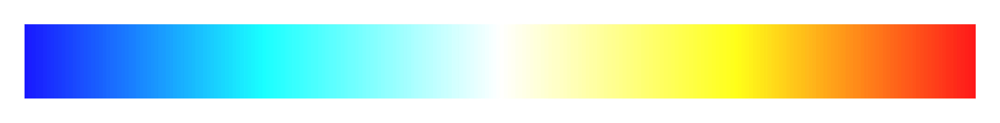

In [9]:
mycm = matplotlib.colors.LinearSegmentedColormap.from_list(
    'my_gradient',
    (
        (0.0, (0.1, 0.1, 1.,)),
        (0.25, (0.1, 1., 1.,)),
        (0.5, (1., 1., 1.,)),
        (0.75, (1., 1., 0.1,)),
        (1.0, (1., 0.1, 0.1,)),
    )
)

fig, ax = plt.subplots(1, 1, figsize=(5, 1),)
ax.imshow(np.linspace(0, 1, 256)[np.newaxis, :].repeat(20,0), cmap=mycm)
ax.set_axis_off()


EMOTION


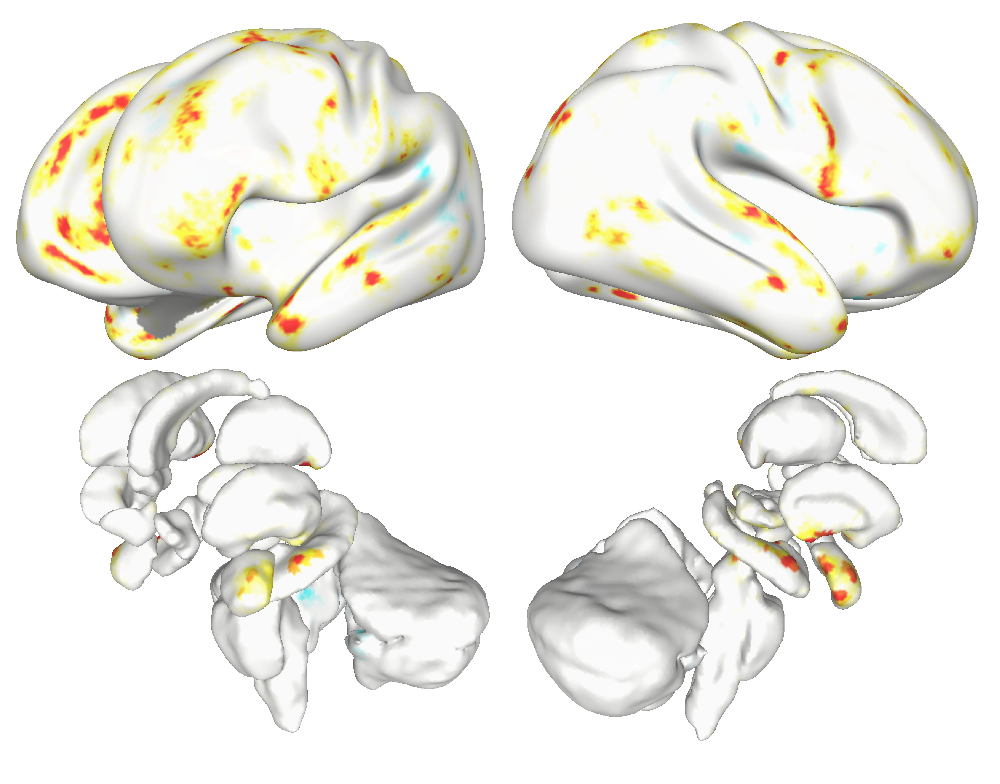

GAMBLING


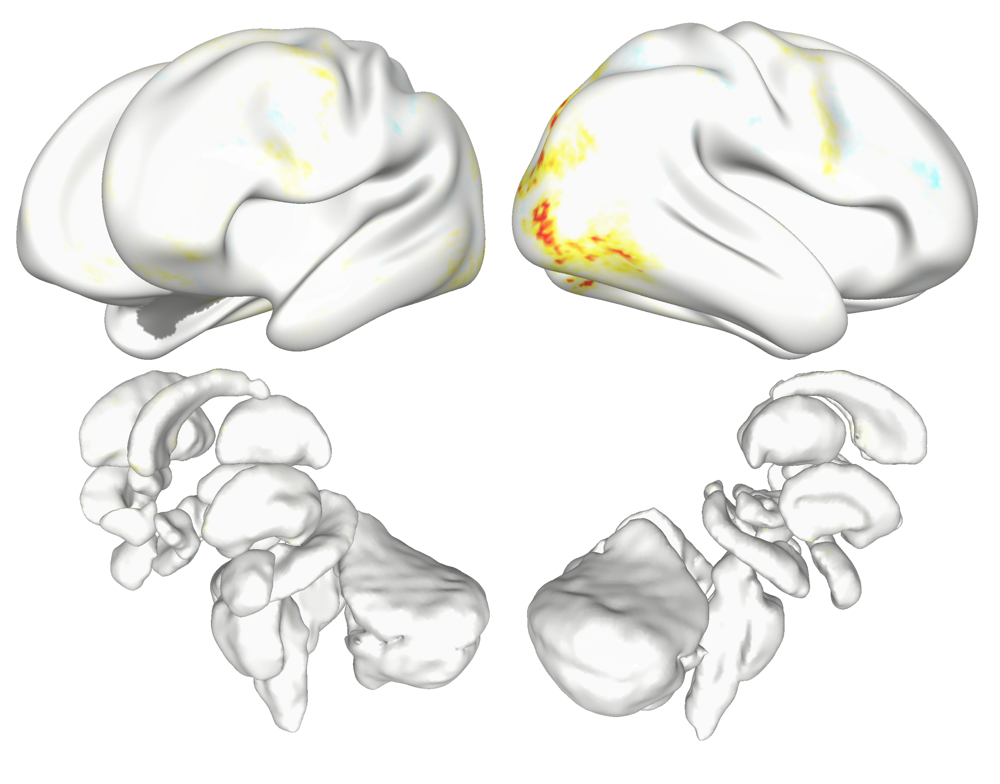

RELATIONAL


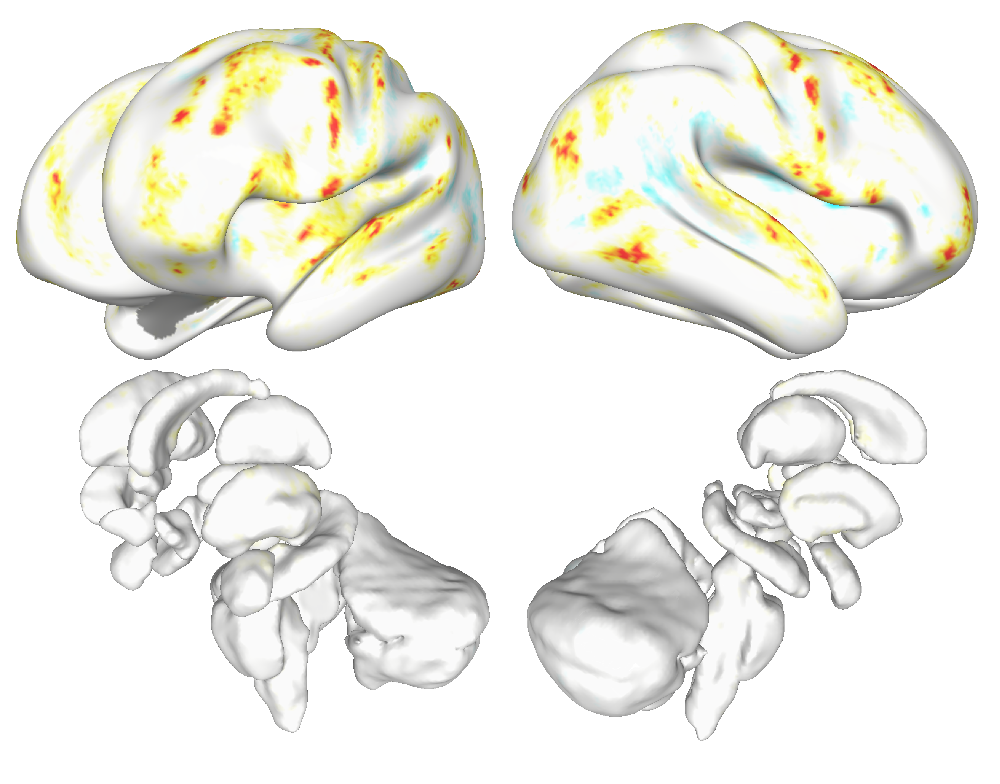

SOCIAL


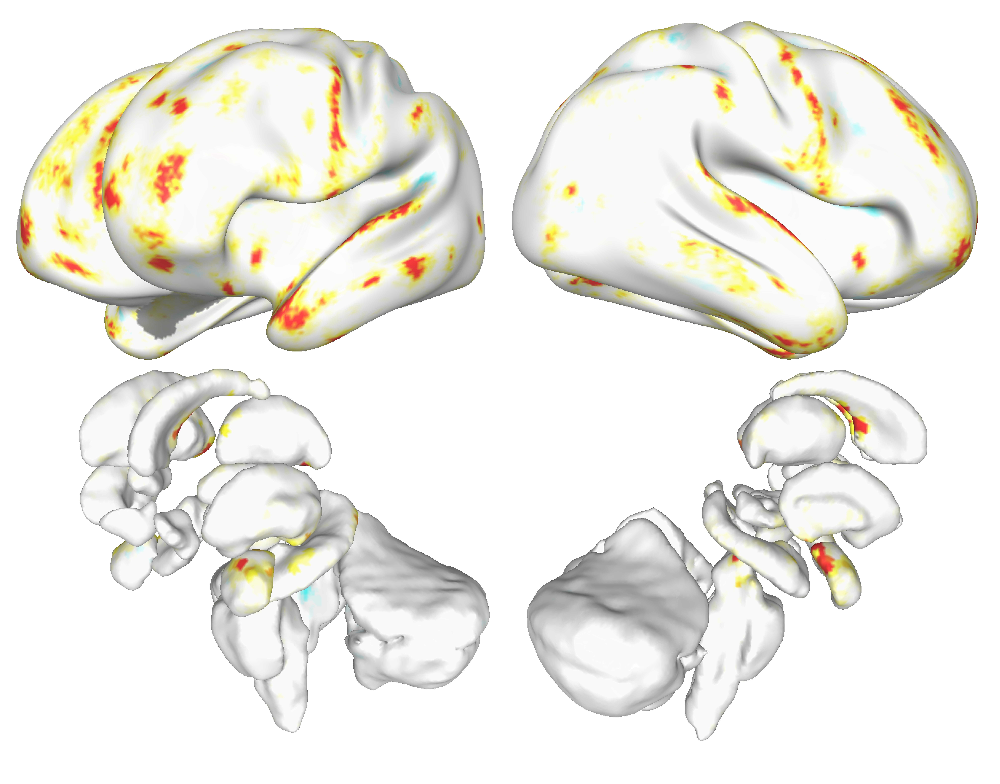

WM


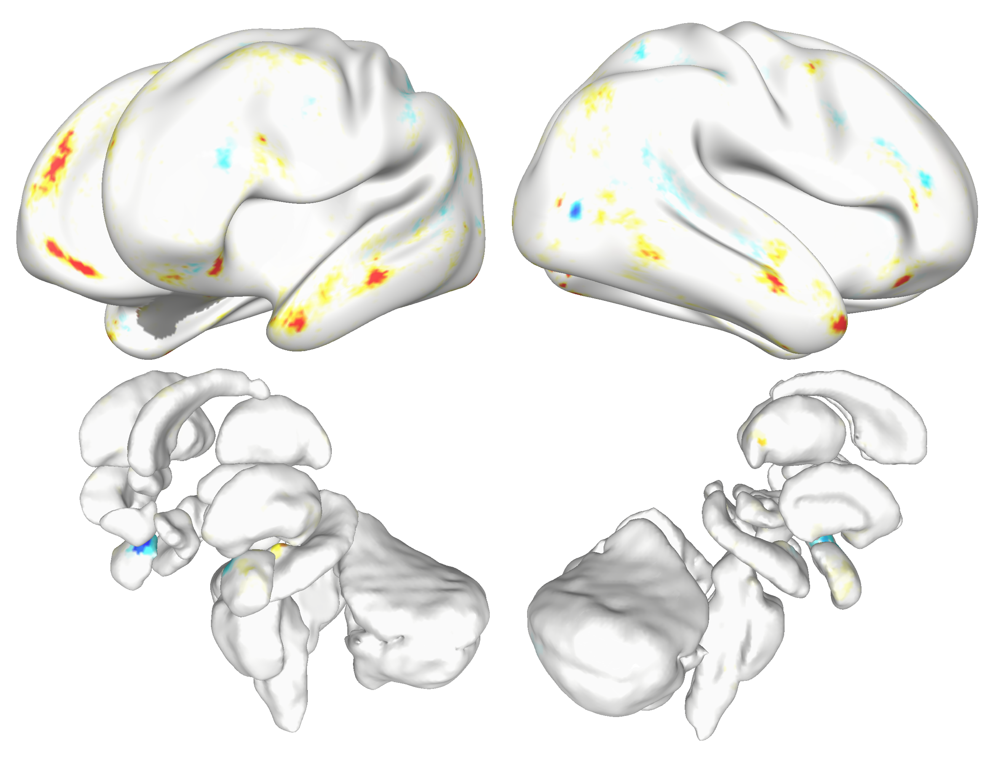

CPU times: user 56.8 s, sys: 2.39 s, total: 59.2 s
Wall time: 58.9 s


In [10]:
%%time

sample_size = 40

logp_threshold = -np.log10(0.05)

for ci, task in enumerate(tasks):
    t_stats = loaded_maps['uncorrected_tstat'][task][f'N={sample_size}']
    t_stats = t_stats[~np.isnan(t_stats).any(axis=1)]

    topological_cluster_logps = loaded_maps['topological_cluster_corrected_tstat'][task][f'N={sample_size}']
    topological_cluster_logps = topological_cluster_logps[~np.isnan(topological_cluster_logps).any(axis=1)]
    topological_positive_effects = np.multiply(np.mean((topological_cluster_logps>logp_threshold) & (t_stats>0), 0), (ground_truth_effect[task]>0))
    topological_negative_effects = np.multiply(np.mean((topological_cluster_logps>logp_threshold) & (t_stats<0), 0), (ground_truth_effect[task]<0))

    spatial_cluster_logps = loaded_maps['spatial_cluster_corrected_tstat'][task][f'N={sample_size}']
    spatial_cluster_logps = spatial_cluster_logps[~np.isnan(spatial_cluster_logps).any(axis=1)]
    spatial_positive_effects = np.multiply(np.mean((spatial_cluster_logps>logp_threshold) & (t_stats>0), 0), (ground_truth_effect[task]>0))
    spatial_negative_effects = np.multiply(np.mean((spatial_cluster_logps>logp_threshold) & (t_stats<0), 0), (ground_truth_effect[task]<0))

    topological_sensitivity = (topological_positive_effects + topological_negative_effects)
    spatial_sensitivity = (spatial_positive_effects + spatial_negative_effects)
    localized_sensitivity_improvement = topological_sensitivity - spatial_sensitivity
    
    print(task)
    fig, axes = plt.subplots(1, 2, figsize=(10, 8),)
    plt.subplots_adjust(wspace=0, hspace=0)
    my_brain_viewer = plot_cifti_with_cerebro(
        dscalar_data=localized_sensitivity_improvement,
        colormap=mycm, axes=axes, clims=(-0.1, 0.1),
    )
